In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS



# First import the dataset and preview the data, the data is about the words that every philosophers said. I want to find out which words they said more often.

In [2]:
df=pd.read_csv("C:/Users/Zero/Documents/GitHub/Fall2021-Project1-yule-yueli/data/philosophy_data.csv")

In [3]:
df.head(n=10)


,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea..."
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ..."
5,Plato - Complete Works,Plato,plato,But someone else has indicted you?,But someone else has indicted you?,-350,1997,34,but someone else has indicted you?,"['but', 'someone', 'else', 'has', 'indicted', ...",but someone else have indict -PRON- ?
6,Plato - Complete Works,Plato,plato,"I do not really know him myself, Euthyphro.","I do not really know him myself, Euthyphro.",-350,1997,43,"i do not really know him myself, euthyphro.","['do', 'not', 'really', 'know', 'him', 'myself...","-PRON- do not really know -PRON- -PRON- , Eut..."
7,Plato - Complete Works,Plato,plato,He is apparently young and unknown.,He is apparently young and unknown.,-350,1997,35,he is apparently young and unknown.,"['he', 'is', 'apparently', 'young', 'and', 'un...",-PRON- be apparently young and unknown .
8,Plato - Complete Works,Plato,plato,"They call him Meletus, I believe.","They call him Meletus, I believe.",-350,1997,33,"they call him meletus, i believe.","['they', 'call', 'him', 'meletus', 'believe']","-PRON- call -PRON- Meletus , -PRON- believe ."
9,Plato - Complete Works,Plato,plato,"He belongs to the Pitthean deme, if you know a...","He belongs to the Pitthean deme, if you know a...",-350,1997,147,"he belongs to the pitthean deme, if you know a...","['he', 'belongs', 'to', 'the', 'pitthean', 'de...","-PRON- belong to the Pitthean deme , if -PRON..."


# Here is the version of jupyter notebook

In [4]:
import sys
print(sys.version)
print(sys.executable)

3.7.1 (default, Dec 10 2018, 22:54:23) [MSC v.1915 64 bit (AMD64)]
C:\Users\Zero\Anaconda3\python.exe


# Creat a new variable called n_txt（number of tokenized_txt) and find out the number of valid words in every sentence.

In [5]:
df['n_txt'] = list(map(len,map(eval,df.tokenized_txt)))

# Then preview the new dataset

In [6]:
df.head(n=10)

,title,author,school,sentence_spacy,sentence_str,original_publication_date,corpus_edition_date,sentence_length,sentence_lowered,tokenized_txt,lemmatized_str,n_txt
0,Plato - Complete Works,Plato,plato,"What's new, Socrates, to make you leave your ...","What's new, Socrates, to make you leave your ...",-350,1997,125,"what's new, socrates, to make you leave your ...","['what', 'new', 'socrates', 'to', 'make', 'you...","what be new , Socrates , to make -PRON- lea...",23
1,Plato - Complete Works,Plato,plato,Surely you are not prosecuting anyone before t...,Surely you are not prosecuting anyone before t...,-350,1997,69,surely you are not prosecuting anyone before t...,"['surely', 'you', 'are', 'not', 'prosecuting',...",surely -PRON- be not prosecute anyone before ...,12
2,Plato - Complete Works,Plato,plato,The Athenians do not call this a prosecution b...,The Athenians do not call this a prosecution b...,-350,1997,74,the athenians do not call this a prosecution b...,"['the', 'athenians', 'do', 'not', 'call', 'thi...",the Athenians do not call this a prosecution ...,11
3,Plato - Complete Works,Plato,plato,What is this you say?,What is this you say?,-350,1997,21,what is this you say?,"['what', 'is', 'this', 'you', 'say']",what be this -PRON- say ?,5
4,Plato - Complete Works,Plato,plato,"Someone must have indicted you, for you are no...","Someone must have indicted you, for you are no...",-350,1997,101,"someone must have indicted you, for you are no...","['someone', 'must', 'have', 'indicted', 'you',...","someone must have indict -PRON- , for -PRON- ...",19
5,Plato - Complete Works,Plato,plato,But someone else has indicted you?,But someone else has indicted you?,-350,1997,34,but someone else has indicted you?,"['but', 'someone', 'else', 'has', 'indicted', ...",but someone else have indict -PRON- ?,6
6,Plato - Complete Works,Plato,plato,"I do not really know him myself, Euthyphro.","I do not really know him myself, Euthyphro.",-350,1997,43,"i do not really know him myself, euthyphro.","['do', 'not', 'really', 'know', 'him', 'myself...","-PRON- do not really know -PRON- -PRON- , Eut...",7
7,Plato - Complete Works,Plato,plato,He is apparently young and unknown.,He is apparently young and unknown.,-350,1997,35,he is apparently young and unknown.,"['he', 'is', 'apparently', 'young', 'and', 'un...",-PRON- be apparently young and unknown .,6
8,Plato - Complete Works,Plato,plato,"They call him Meletus, I believe.","They call him Meletus, I believe.",-350,1997,33,"they call him meletus, i believe.","['they', 'call', 'him', 'meletus', 'believe']","-PRON- call -PRON- Meletus , -PRON- believe .",5
9,Plato - Complete Works,Plato,plato,"He belongs to the Pitthean deme, if you know a...","He belongs to the Pitthean deme, if you know a...",-350,1997,147,"he belongs to the pitthean deme, if you know a...","['he', 'belongs', 'to', 'the', 'pitthean', 'de...","-PRON- belong to the Pitthean deme , if -PRON...",26


# First see the distributions of 3 categories:title, author, school.

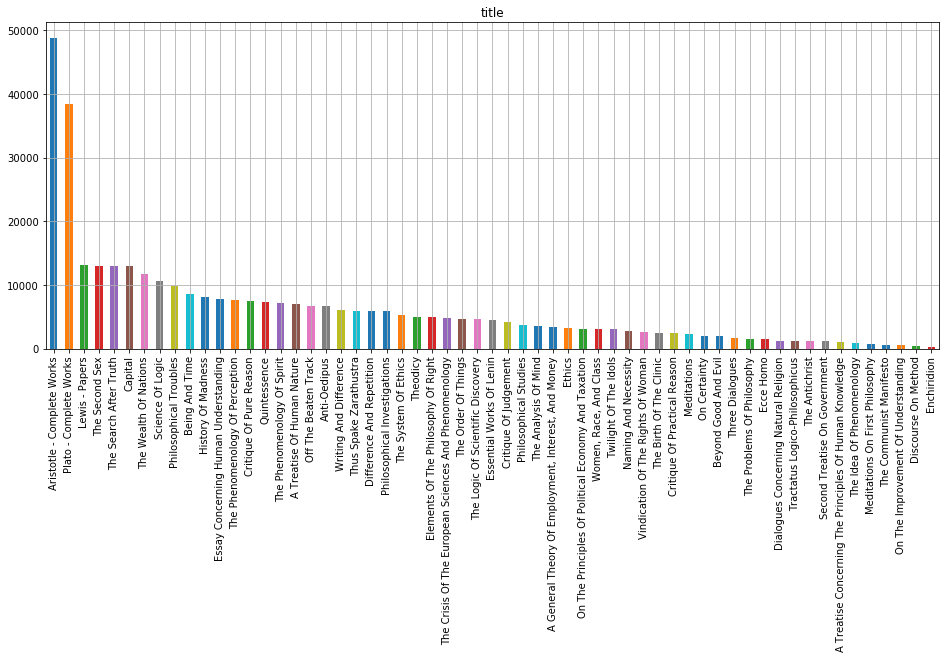

In [107]:
plt.figure(figsize=(16,6))
df['title'].value_counts().plot(kind='bar')
plt.title('title')
plt.grid()
plt.show()

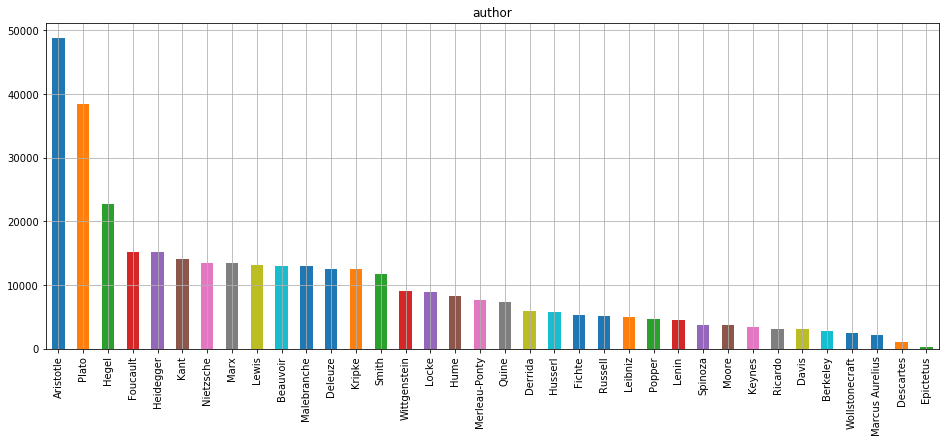

In [108]:
plt.figure(figsize=(16,6))
df['author'].value_counts().plot(kind='bar')
plt.title('author')
plt.grid()
plt.show()



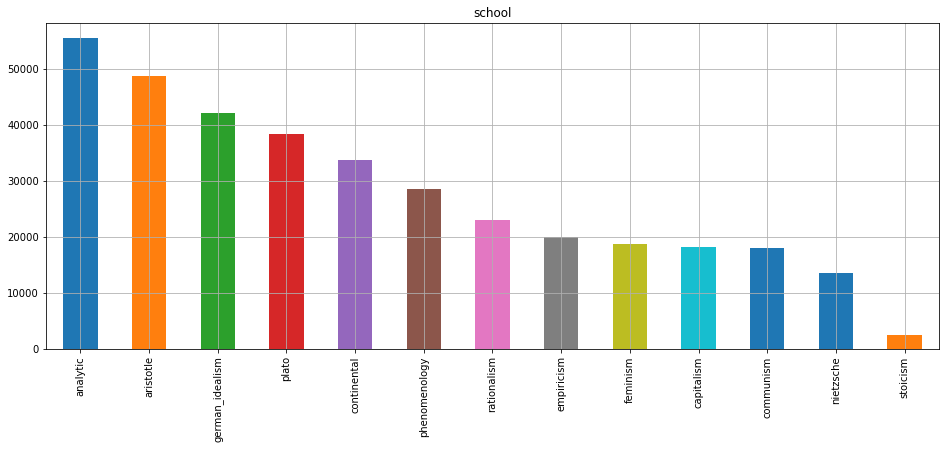

In [109]:
plt.figure(figsize=(16,6))
df['school'].value_counts().plot(kind='bar')
plt.title('school')
plt.grid()
plt.show()

# Histgram of n_txt, the distribution of n_txt is right skewed

count    360808.000000
mean         25.693216
std          17.766261
min           0.000000
25%          13.000000
50%          22.000000
75%          34.000000
max         398.000000
Name: n_txt, dtype: float64


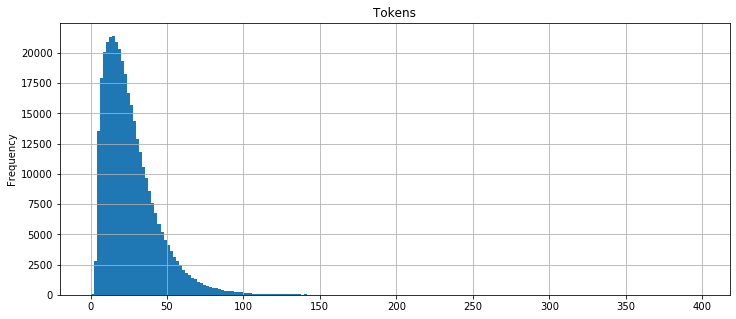

In [110]:
print(df.n_txt.describe())

plt.figure(figsize=(12,5))
df.n_txt.plot(kind='hist', bins=200)
plt.title('Tokens')
plt.grid()
plt.show()

# violin plot about n_txt by schools: approximately same means

C:\Users\Zero\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


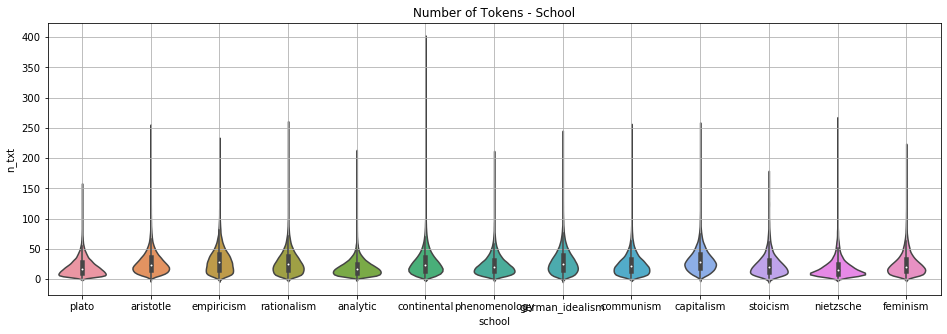

In [111]:
plt.figure(figsize=(16,5))
sns.violinplot(x='school', y='n_txt', data=df)
plt.title('Number of Tokens - School')
plt.grid()
plt.show()

# WordClouds by school

In [8]:
stopwords = set(STOPWORDS)

School =  PLATO :


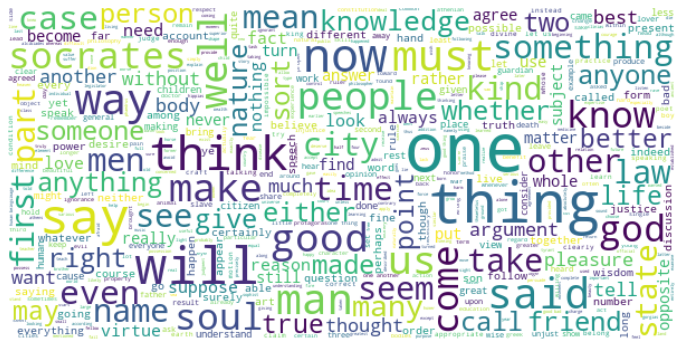

School =  ARISTOTLE :


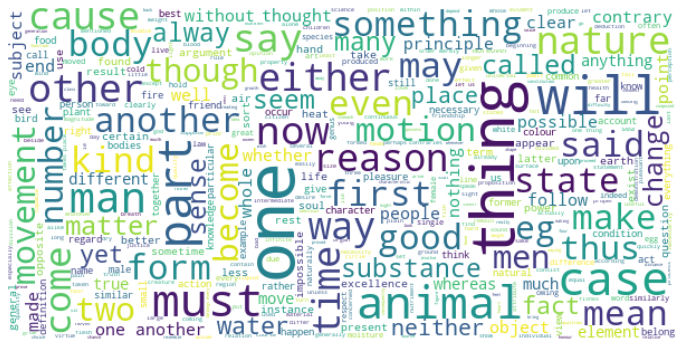

School =  EMPIRICISM :


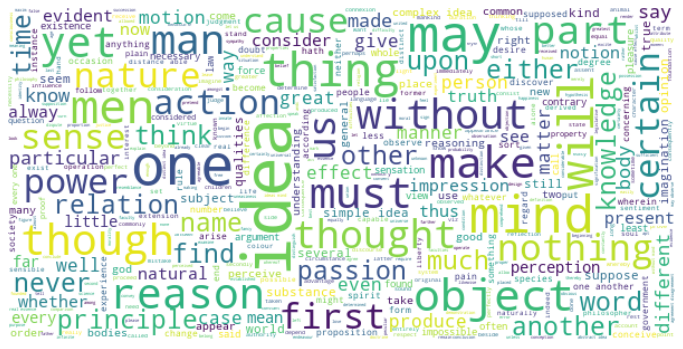

School =  RATIONALISM :


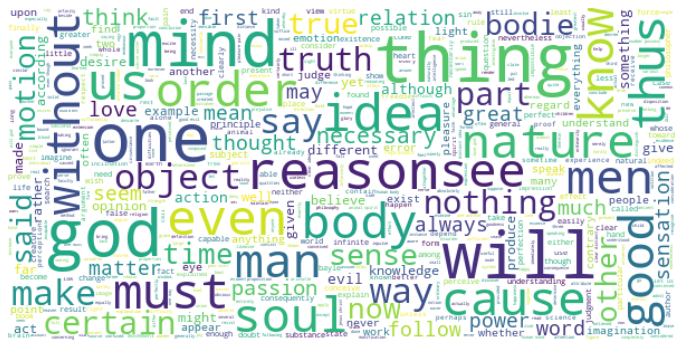

School =  ANALYTIC :


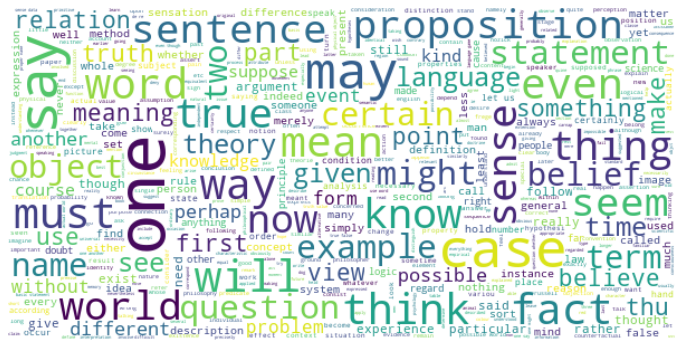

School =  CONTINENTAL :


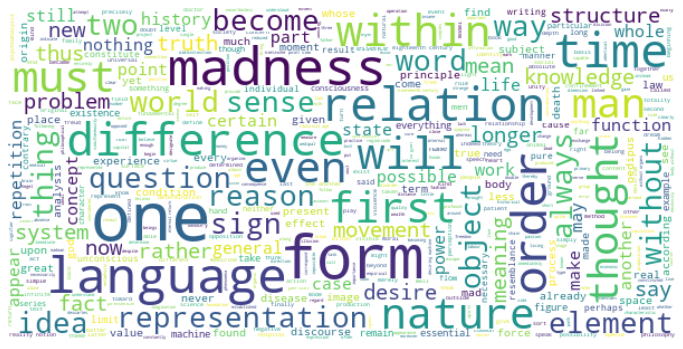

School =  PHENOMENOLOGY :


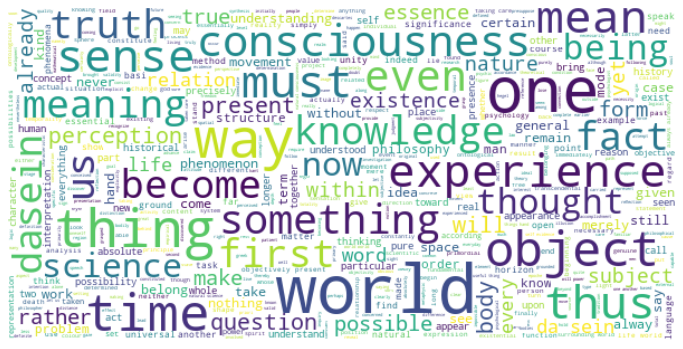

School =  GERMAN_IDEALISM :


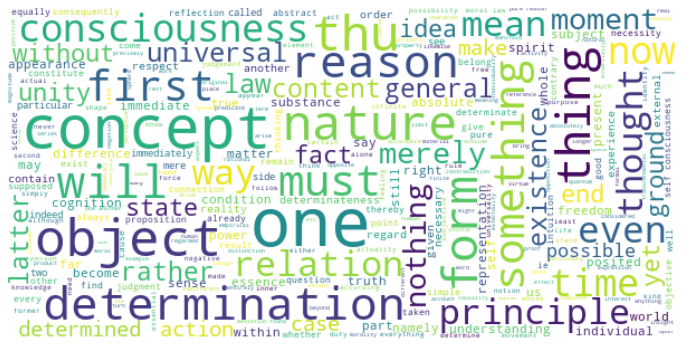

School =  COMMUNISM :


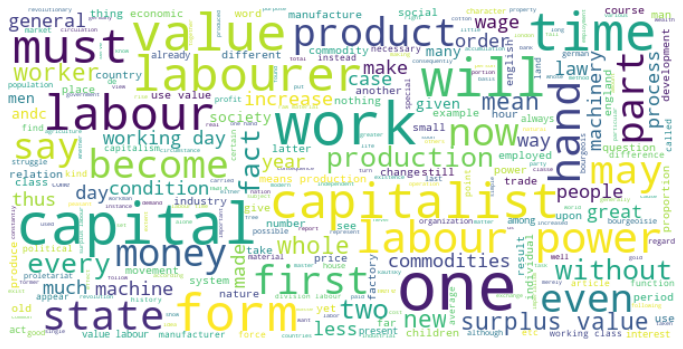

School =  CAPITALISM :


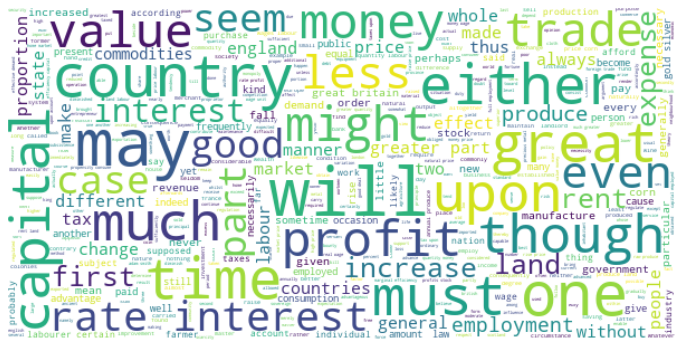

School =  STOICISM :


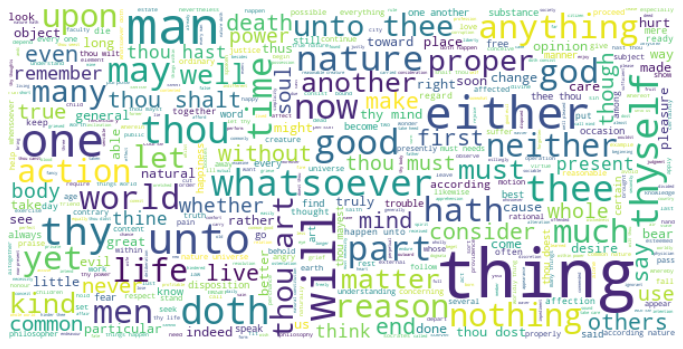

School =  NIETZSCHE :


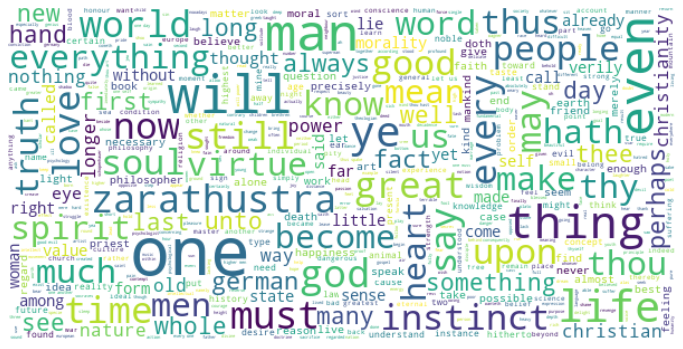

School =  FEMINISM :


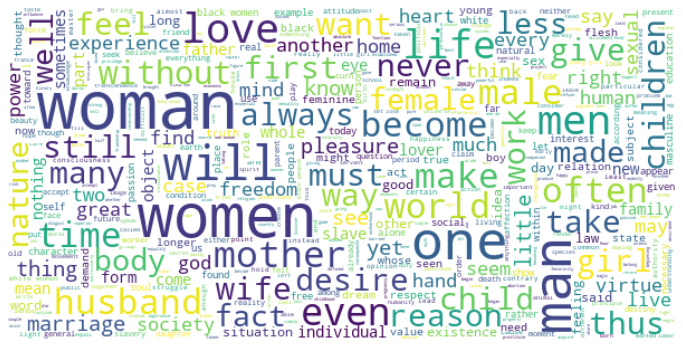

In [113]:
schools = df.school.unique().tolist()
for sc in schools:
    df_temp = df[df.school==sc]
    
    print('School = ', sc.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=60, max_words=600,
                          width = 600, height = 300,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# WorldClouds by some authors

In [35]:
a=df['author'].value_counts()
a

Aristotle          48779
Plato              38366
Hegel              22700
Foucault           15240
Heidegger          15239
Kant               14128
Nietzsche          13548
Marx               13489
Lewis              13120
Beauvoir           13017
Malebranche        12997
Deleuze            12540
Kripke             12479
Smith              11693
Wittgenstein        9034
Locke               8885
Hume                8312
Merleau-Ponty       7592
Quine               7373
Derrida             5999
Husserl             5742
Fichte              5308
Russell             5073
Leibniz             5027
Popper              4678
Lenin               4469
Spinoza             3793
Moore               3668
Keynes              3411
Ricardo             3090
Davis               3059
Berkeley            2734
Wollstonecraft      2559
Marcus Aurelius     2212
Descartes           1132
Epictetus            323
Name: author, dtype: int64

Author =  ARISTOTLE :


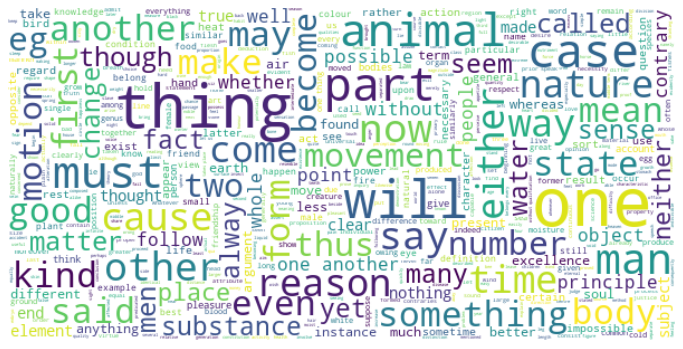

Author =  PLATO :


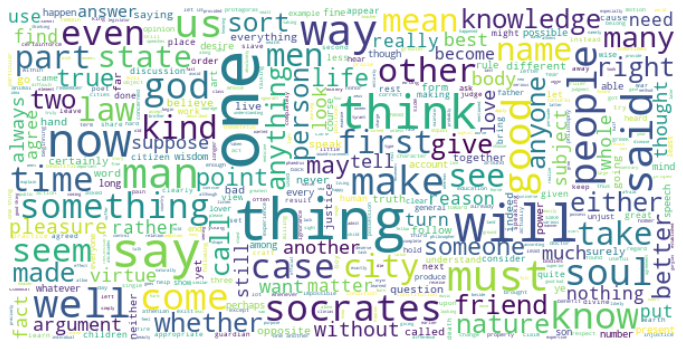

Author =  HEGEL :


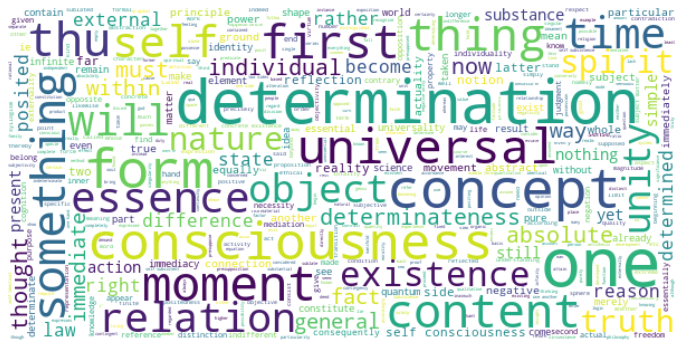

Author =  FOUCAULT :


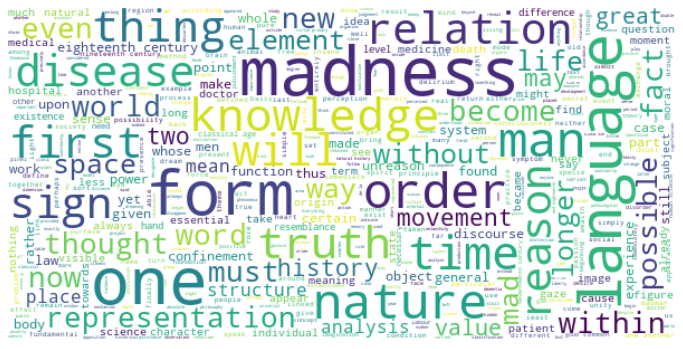

Author =  HEIDEGGER :


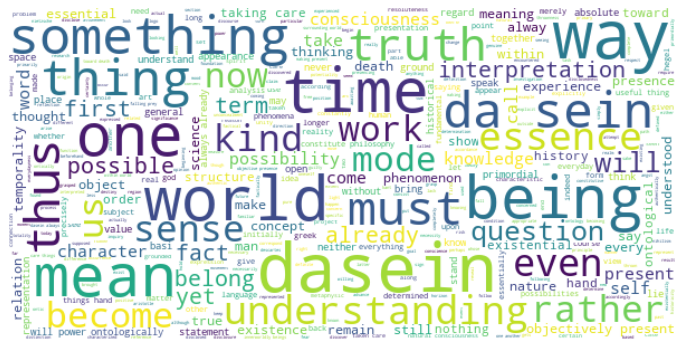

Author =  KANT :


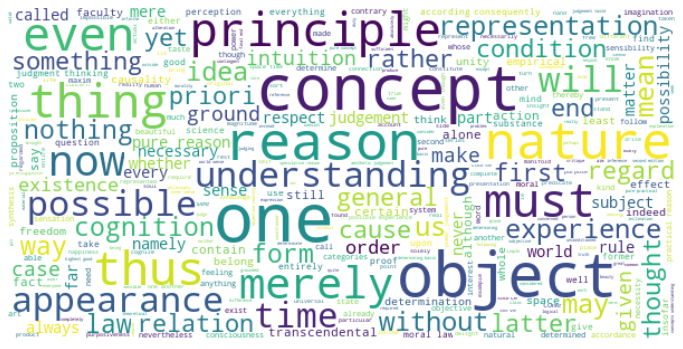

Author =  NIETZSCHE :


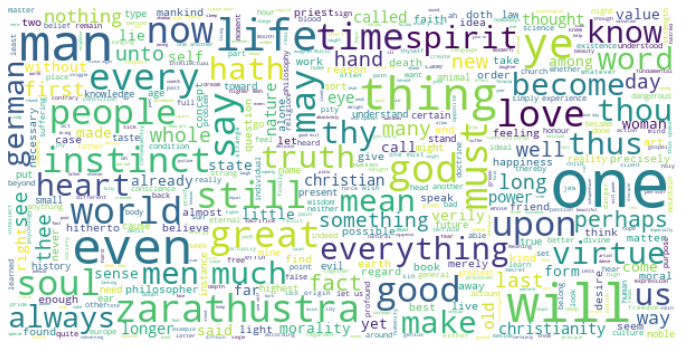

Author =  MARX :


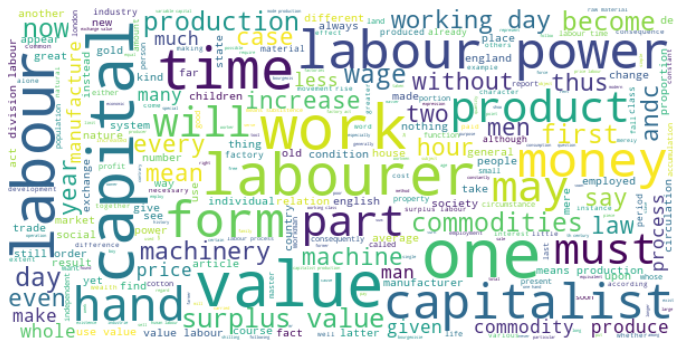

Author =  LEWIS :


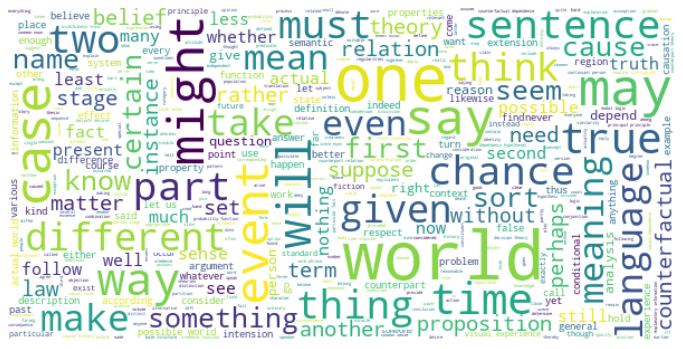

Author =  BEAUVOIR :


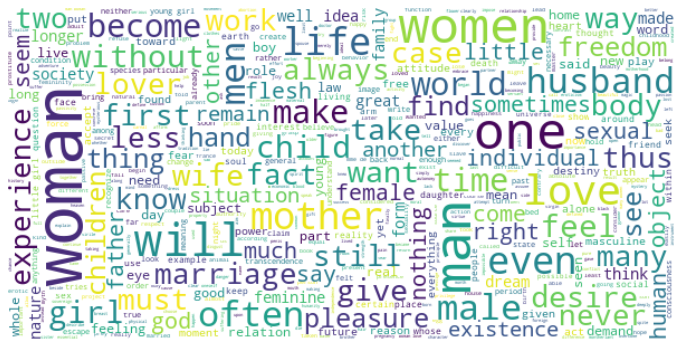

In [39]:
authors=['Aristotle','Plato','Hegel','Foucault','Heidegger','Kant','Nietzsche','Marx',
        'Lewis','Beauvoir']

for sc in authors:
    df_temp = df[df.author==sc]
    
    print('Author = ', sc.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=60, max_words=600,
                          width = 600, height = 300,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# WorldClouds by some titles

In [41]:
t=df['title'].value_counts()
t

Aristotle - Complete Works                                 48779
Plato - Complete Works                                     38366
Lewis - Papers                                             13120
The Second Sex                                             13017
The Search After Truth                                     12997
Capital                                                    12996
The Wealth Of Nations                                      11693
Science Of Logic                                           10678
Philosophical Troubles                                      9798
Being And Time                                              8505
History Of Madness                                          8033
Essay Concerning Human Understanding                        7742
The Phenomenology Of Perception                             7592
Critique Of Pure Reason                                     7472
Quintessence                                                7373
The Phenomenology Of Spir

Author =  ARISTOTLE - COMPLETE WORKS :


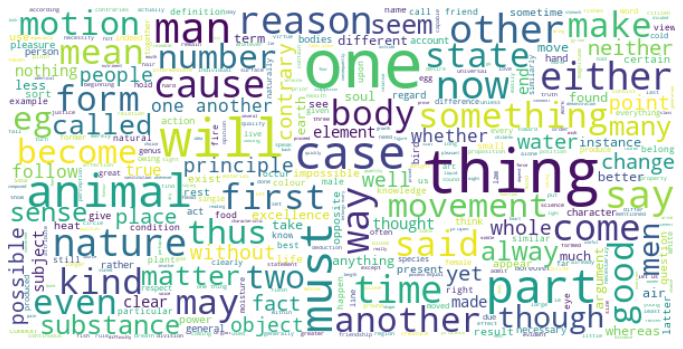

Author =  PLATO - COMPLETE WORKS :


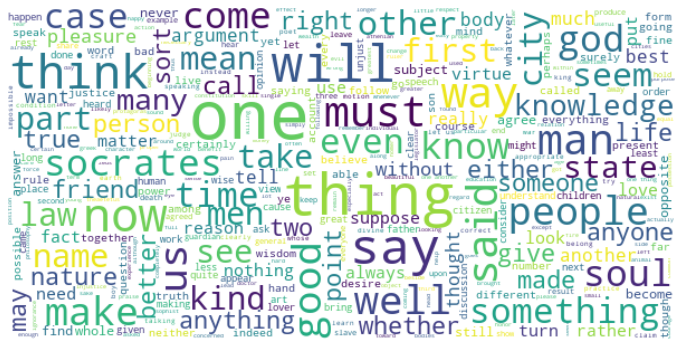

Author =  LEWIS - PAPERS :


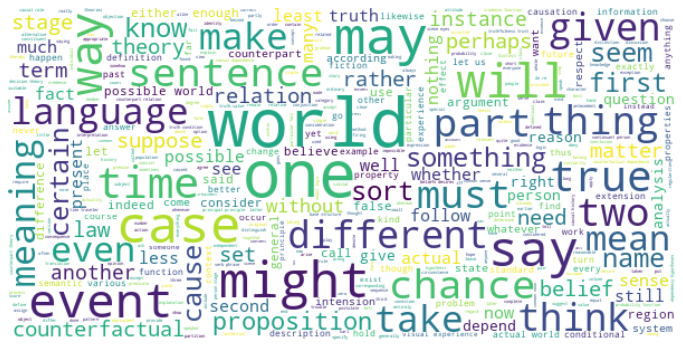

Author =  THE SECOND SEX :


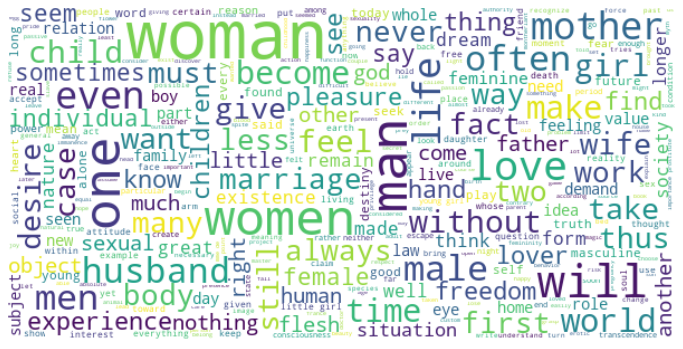

Author =  THE SEARCH AFTER TRUTH :


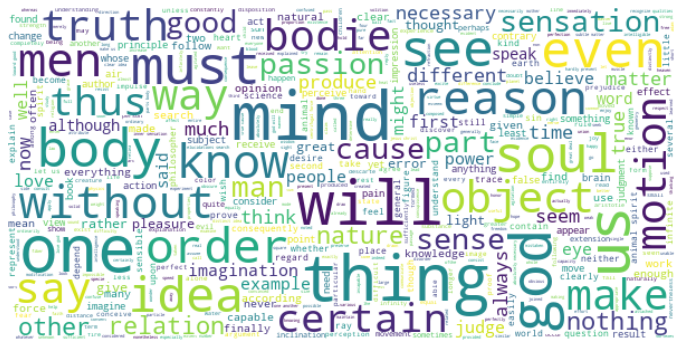

Author =  CAPITAL :


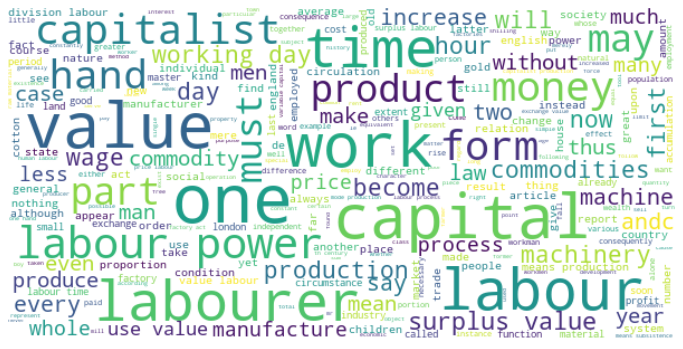

Author =  THE WEALTH OF NATIONS :


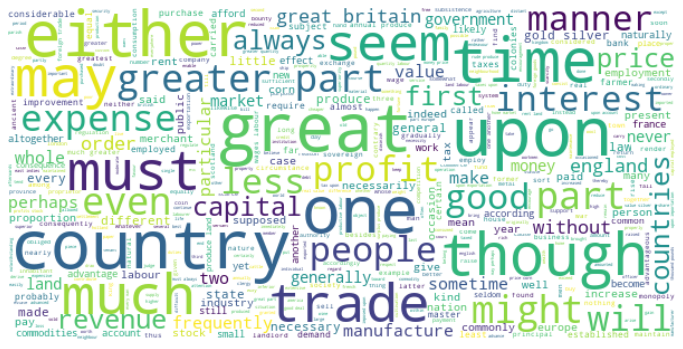

Author =  THE WEALTH OF NATIONS :


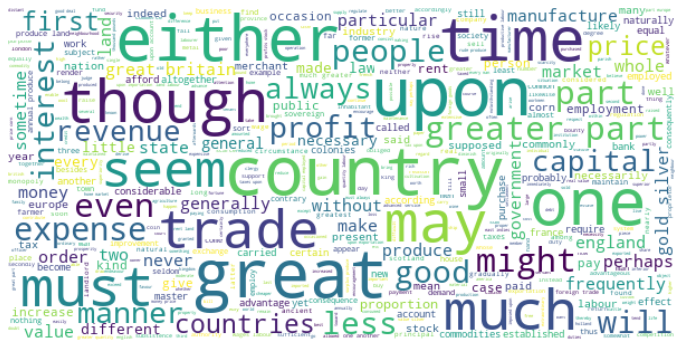

In [43]:
titles=['Aristotle - Complete Works','Plato - Complete Works','Lewis - Papers','The Second Sex','The Search After Truth',
       'Capital','The Wealth Of Nations','The Wealth Of Nations']
for sc in titles:
    df_temp = df[df.title==sc]
    
    print('Author = ', sc.upper(), ':')
    
    # render wordcloud
    text = " ".join(txt for txt in df_temp.sentence_lowered)
    wordcloud = WordCloud(stopwords=stopwords, max_font_size=60, max_words=600,
                          width = 600, height = 300,
                          background_color="white").generate(text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# conclusion:
# 1.Different schools have the same means of numbers of valid words in every sentence.
# 2. The words said often by different schools:
# PLATO: Think, Socrates,.
# ARISTOTLE: Animal, Nature..
# EMPIRICISM: Idea, Mind
# RATIONALISM: Reason, Mind..
# ANALYTIC: Fact, Proposition..
# CONTINENTAL: Language, Relation..
# PHENOMENOLOGY: Consciousness, Experience..
# GERMAN_IDEALISM: Concept, Determination..
# COMMUNISM: Capital, Labour..
# CAPITALISM: Country, Profit..
# STOICISM: Thyself, God..
# NIETZSCHE: Instinct, Love..
# FEMINISM: Life, Woman..
# 3.The same to analyze the image about words said by different authors and titles
